In [1]:
import tensorflow as tf
print(tf.__version__)

2.2.0


In [2]:
import tensorflow_datasets as tfds

tfds.__version__

'3.2.1'

train,validation,test data set을 80:10:10 비율로 나눈다.

In [3]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)

In [4]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


In [5]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

데이터 확인하기

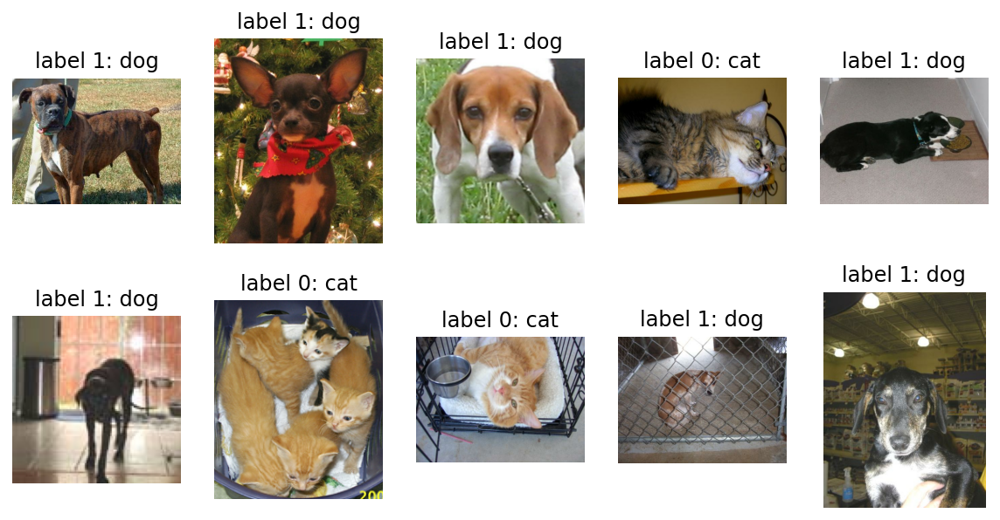

In [6]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

이미지 리사이즈

In [7]:
IMG_SIZE = 160 # All images will be resized to 160x160

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [8]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

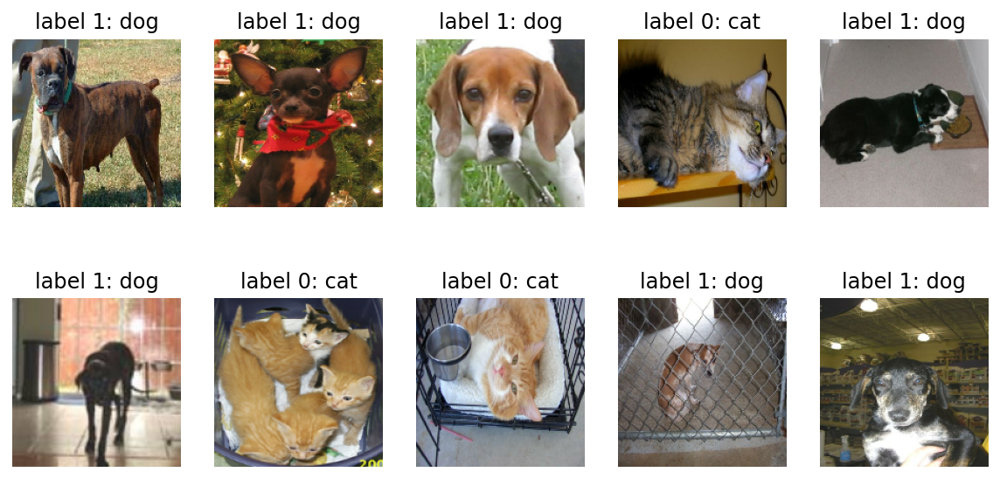

In [9]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [10]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

In [11]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=2, activation='softmax')
])

In [12]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

In [13]:
import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
image

(2, 2)


array([[1, 2],
       [3, 4]])

In [14]:
image.flatten()

array([1, 2, 3, 4])

모델 컴파일

In [15]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

Data Option

In [16]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

In [17]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [18]:
for image_batch, label_batch in train_batches.take(1):
    pass

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

train

In [19]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 [==============================] - 0s 15ms/step - loss: 0.6970 - accuracy: 0.4672
initial loss: 0.70
initial accuracy: 0.47


In [20]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
582/582 [==============================] - 40s 69ms/step - loss: 0.5937 - accuracy: 0.6759 - val_loss: 0.5368 - val_accuracy: 0.7313
Epoch 2/10
582/582 [==============================] - 20s 35ms/step - loss: 0.4833 - accuracy: 0.7677 - val_loss: 0.5216 - val_accuracy: 0.7476
Epoch 3/10
582/582 [==============================] - 20s 34ms/step - loss: 0.4218 - accuracy: 0.8052 - val_loss: 0.4783 - val_accuracy: 0.7730
Epoch 4/10
582/582 [==============================] - 19s 33ms/step - loss: 0.3727 - accuracy: 0.8353 - val_loss: 0.4674 - val_accuracy: 0.7803
Epoch 5/10
582/582 [==============================] - 19s 32ms/step - loss: 0.3252 - accuracy: 0.8607 - val_loss: 0.6550 - val_accuracy: 0.7253
Epoch 6/10
582/582 [==============================] - 19s 33ms/step - loss: 0.2779 - accuracy: 0.8861 - val_loss: 0.5295 - val_accuracy: 0.7696
Epoch 7/10
582/582 [==============================] - 19s 32ms/step - loss: 0.2298 - accuracy: 0.9088 - val_loss: 0.5093 - val_accuracy:

train/val accuracy curve and train/val loss curve

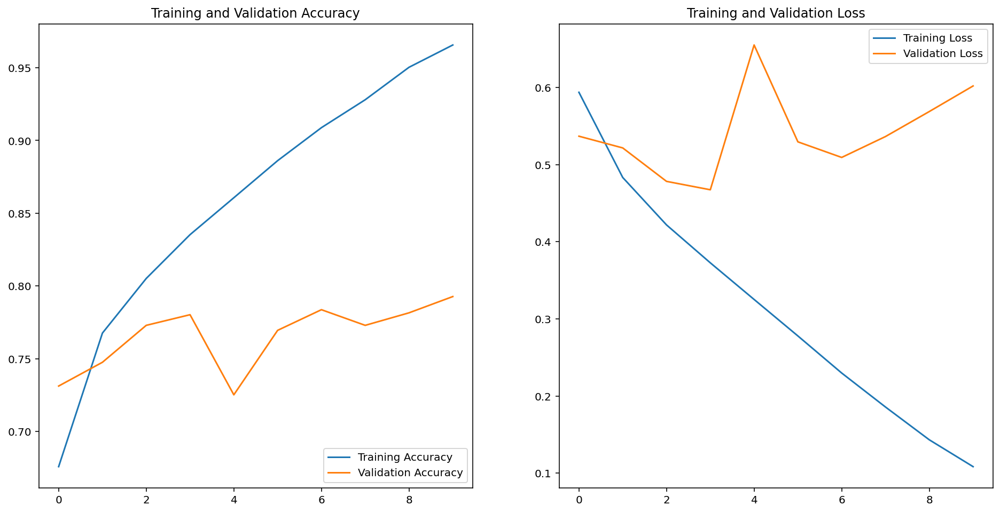

In [21]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [22]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.99688745e-01, 3.11236538e-04],
       [8.86995494e-01, 1.13004565e-01],
       [4.48463798e-01, 5.51536202e-01],
       [9.99982238e-01, 1.78042410e-05],
       [8.36882830e-01, 1.63117141e-01],
       [6.68845996e-02, 9.33115423e-01],
       [1.01187704e-02, 9.89881217e-01],
       [7.41194904e-01, 2.58805126e-01],
       [2.87913263e-01, 7.12086737e-01],
       [4.31327164e-01, 5.68672836e-01],
       [6.77017123e-03, 9.93229866e-01],
       [9.94502425e-01, 5.49753988e-03],
       [9.92381036e-01, 7.61889480e-03],
       [1.21855803e-04, 9.99878168e-01],
       [9.36829746e-01, 6.31702691e-02],
       [9.90429938e-01, 9.56998765e-03],
       [7.19921350e-01, 2.80078620e-01],
       [6.49974245e-05, 9.99935031e-01],
       [9.40928817e-01, 5.90711795e-02],
       [9.97466564e-01, 2.53348518e-03],
       [9.28333163e-01, 7.16667846e-02],
       [9.45699811e-01, 5.43001555e-02],
       [9.98638570e-01, 1.36141153e-03],
       [8.87771487e-01, 1.12228468e-01],
       [7.201196

In [23]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 0])

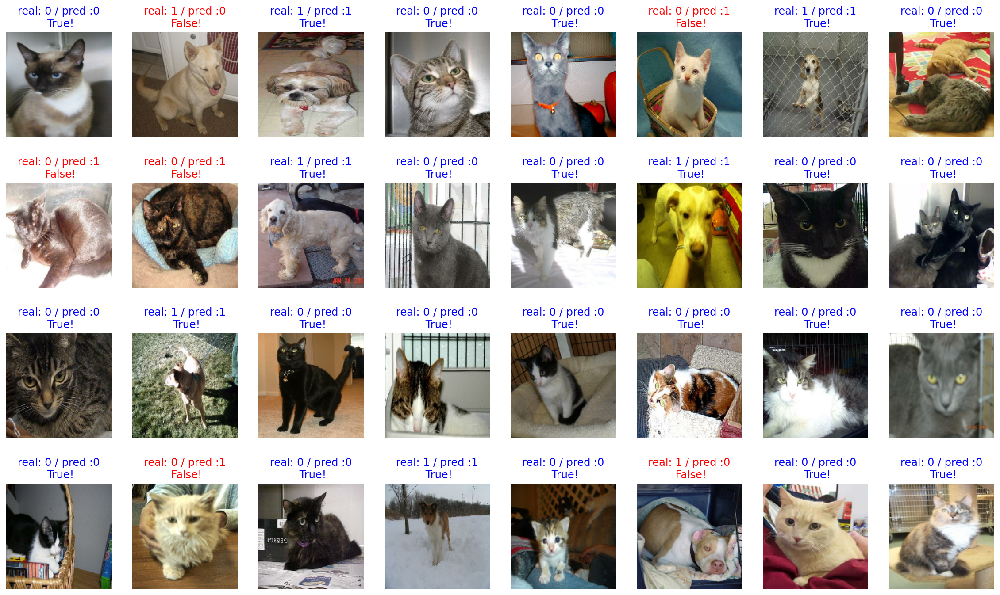

In [24]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [25]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
  if label == prediction:
    count+=1

print(count / 32 * 100)    # 약 70% 내외

81.25


Load VGG model

In [26]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [27]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

Classifier는 따로 학습할 거기 때문에 feature extraction 부분만 load 한다.

In [28]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

Add flatten layer

In [29]:
import numpy as np

image = np.array([[1, 2],
                  [3, 4]])

flattened_image = image.flatten()

print("Original image:\n", image)
print("Original image shape:", image.shape)
print()
print("Flattened image:\n", flattened_image)
print("Flattened image shape:", flattened_image.shape)

Original image:
 [[1 2]
 [3 4]]
Original image shape: (2, 2)

Flattened image:
 [1 2 3 4]
Flattened image shape: (4,)


Add Global Average Pooling

In [30]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

base model은 train 되면 안되므로 다음과 같이 실행한다.

In [31]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [32]:
base_model.trainable = False

In [33]:
dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(2, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 2)


In [34]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

In [35]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 1026      
Total params: 14,978,370
Trainable params: 263,682
Non-trainable params: 14,714,688
_________________________________________________________________


In [36]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [37]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 [==============================] - 1s 58ms/step - loss: 0.7910 - accuracy: 0.4703
initial loss: 0.79
initial accuracy: 0.47


In [38]:
EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
582/582 [==============================] - 97s 167ms/step - loss: 0.2453 - accuracy: 0.9092 - val_loss: 0.1715 - val_accuracy: 0.9334
Epoch 2/5
582/582 [==============================] - 51s 88ms/step - loss: 0.1591 - accuracy: 0.9348 - val_loss: 0.1550 - val_accuracy: 0.9325
Epoch 3/5
582/582 [==============================] - 49s 84ms/step - loss: 0.1455 - accuracy: 0.9412 - val_loss: 0.1587 - val_accuracy: 0.9359
Epoch 4/5
582/582 [==============================] - 49s 85ms/step - loss: 0.1382 - accuracy: 0.9432 - val_loss: 0.1513 - val_accuracy: 0.9364
Epoch 5/5
582/582 [==============================] - 50s 87ms/step - loss: 0.1338 - accuracy: 0.9451 - val_loss: 0.1398 - val_accuracy: 0.9437


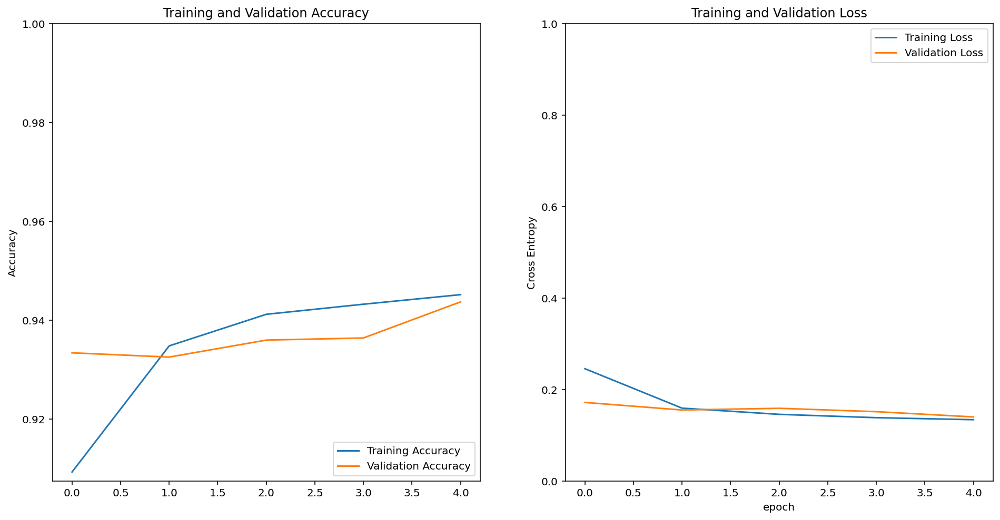

In [39]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [40]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.9998689e-01, 1.3161530e-05],
       [1.0151363e-01, 8.9848632e-01],
       [2.8113657e-01, 7.1886343e-01],
       [9.9999392e-01, 6.0516477e-06],
       [9.9698633e-01, 3.0137186e-03],
       [9.8332781e-01, 1.6672231e-02],
       [1.2296537e-04, 9.9987698e-01],
       [6.4859915e-01, 3.5140088e-01],
       [9.4770181e-01, 5.2298214e-02],
       [9.5956635e-01, 4.0433649e-02],
       [4.3055214e-05, 9.9995697e-01],
       [9.9993360e-01, 6.6358152e-05],
       [9.8676145e-01, 1.3238603e-02],
       [2.7250301e-06, 9.9999726e-01],
       [9.9866605e-01, 1.3339899e-03],
       [9.8391205e-01, 1.6087931e-02],
       [9.9596930e-01, 4.0307664e-03],
       [2.1755937e-02, 9.7824407e-01],
       [5.9962660e-01, 4.0037343e-01],
       [9.9338162e-01, 6.6183824e-03],
       [9.1408128e-01, 8.5918725e-02],
       [9.7816396e-01, 2.1836059e-02],
       [9.9219525e-01, 7.8047221e-03],
       [9.7546488e-01, 2.4535047e-02],
       [9.9787116e-01, 2.1287955e-03],
       [9.7454482e-01, 2.

In [41]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0])

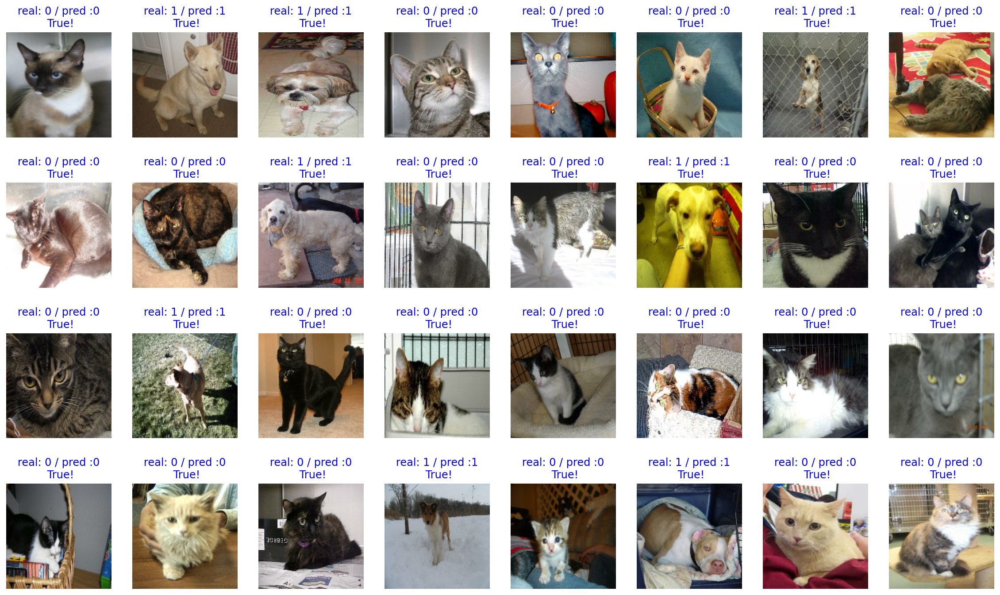

In [42]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [43]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

100.0


In [44]:
import os

checkpoint_dir = os.getenv("HOME") + "/aiffel/cat_vs_dog/checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')
    
model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
  print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


In [45]:
img_dir_path = os.getenv("HOME") + "/aiffel/cat_vs_dog/images"
os.path.exists(img_dir_path)

True

In [46]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

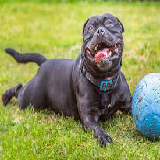

In [47]:
IMG_SIZE = 160
dog_image_path = os.path.join(img_dir_path, 'my_dog.jpeg')

dog_image = load_img(dog_image_path, target_size=(IMG_SIZE, IMG_SIZE))
dog_image

In [48]:
dog_image = img_to_array(dog_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
dog_image.shape

(1, 160, 160, 3)

In [49]:
prediction = model.predict(dog_image)
prediction

array([[0., 1.]], dtype=float32)

In [50]:
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    cat_percentage = round(prediction[0] * 100)
    dog_percentage = round(prediction[1] * 100)
    print(f"This image seems {dog_percentage}% dog, and {cat_percentage}% cat.")

This image seems 100.0% dog, and 0.0% cat.


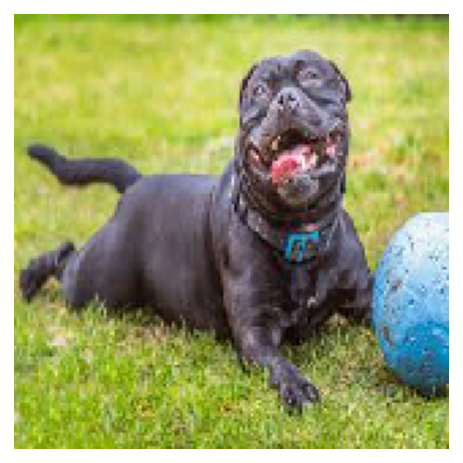

In [51]:
filename = 'my_dog.jpeg'

show_and_predict_image(img_dir_path, filename)

This image seems 78.0% dog, and 22.0% cat.


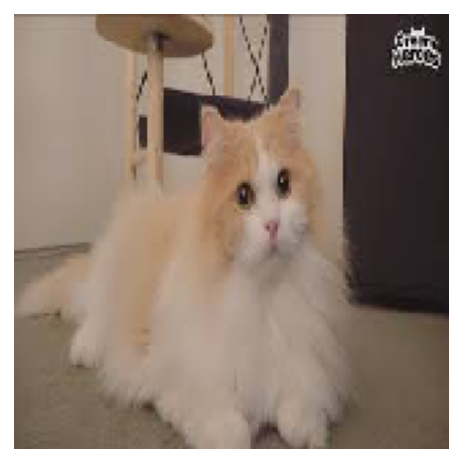

In [54]:
filename = 'my_cat.jpeg'

show_and_predict_image(img_dir_path, filename)

This image seems 100.0% dog, and 0.0% cat.


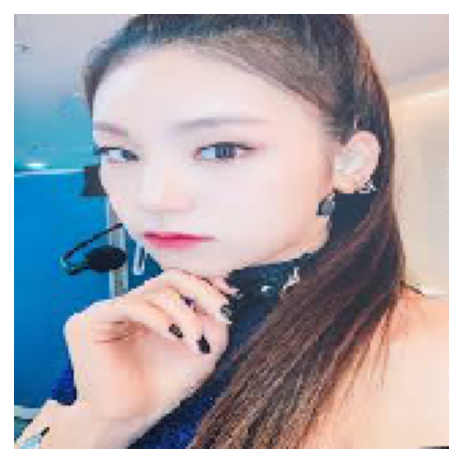

In [53]:
filename = "cat_face.jpeg"
show_and_predict_image(img_dir_path, filename)

In [56]:
tf.keras.backend.clear_session()

# Flowers

## Data Download

In [1]:
import tensorflow_datasets as tfds
import tensorflow as tf
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)

In [2]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


In [3]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

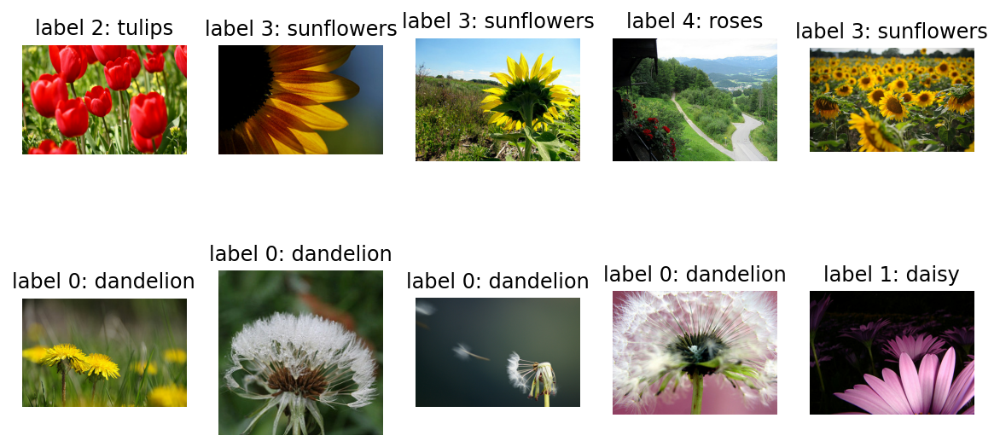

In [4]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [5]:
IMG_SIZE = 160 # All images will be resized to 160x160

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

# Data Option
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

for image_batch, label_batch in train_batches.take(1):
    pass

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

## VGG

In [6]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [7]:
feature_batch = base_model(image_batch)

global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

classes = 5 이므로 마지막 출력은 5ch여야 한다.

In [8]:
metadata

tfds.core.DatasetInfo(
    name='tf_flowers',
    version=3.0.1,
    description='A large set of images of flowers',
    homepage='https://www.tensorflow.org/tutorials/load_data/images',
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=5),
    }),
    total_num_examples=3670,
    splits={
        'train': 3670,
    },
    supervised_keys=('image', 'label'),
    citation="""@ONLINE {tfflowers,
    author = "The TensorFlow Team",
    title = "Flowers",
    month = "jan",
    year = "2019",
    url = "http://download.tensorflow.org/example_images/flower_photos.tgz" }""",
    redistribution_info=,
)

In [9]:
feature_batch_average = global_average_layer(feature_batch)
base_model.trainable = False

dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')
prediction_batch = prediction_layer(dense_layer(feature_batch_average)) 


model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
]) 

### Vgg-Option 1

Epoch 1/20
92/92 [==============================] - 48s 522ms/step - loss: 1.3940 - accuracy: 0.5017 - val_loss: 1.1764 - val_accuracy: 0.6730
Epoch 2/20
92/92 [==============================] - 7s 75ms/step - loss: 1.0667 - accuracy: 0.6938 - val_loss: 0.9334 - val_accuracy: 0.7384
Epoch 3/20
92/92 [==============================] - 7s 76ms/step - loss: 0.8806 - accuracy: 0.7398 - val_loss: 0.7940 - val_accuracy: 0.7548
Epoch 4/20
92/92 [==============================] - 7s 81ms/step - loss: 0.7702 - accuracy: 0.7592 - val_loss: 0.7125 - val_accuracy: 0.7575
Epoch 5/20
92/92 [==============================] - 8s 88ms/step - loss: 0.6968 - accuracy: 0.7755 - val_loss: 0.6662 - val_accuracy: 0.7711
Epoch 6/20
92/92 [==============================] - 7s 81ms/step - loss: 0.6446 - accuracy: 0.7933 - val_loss: 0.6475 - val_accuracy: 0.7738
Epoch 7/20
92/92 [==============================] - 7s 80ms/step - loss: 0.6068 - accuracy: 0.8082 - val_loss: 0.6047 - val_accuracy: 0.7984
Epoch 8/20


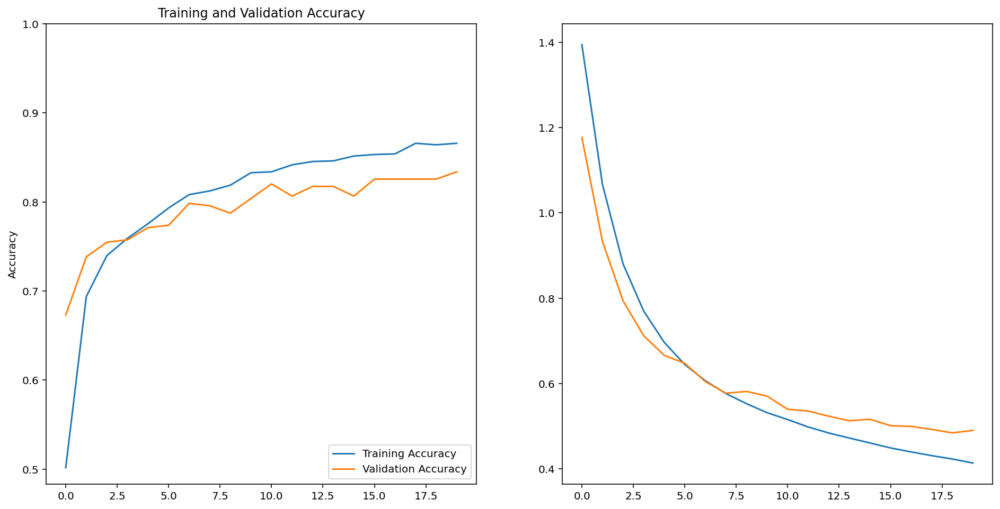

In [12]:
EPOCHS = 20
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

# Train
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

# plot
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')

In [45]:
metrics = model.evaluate(test_batches)

12/12 [==============================] - 1s 53ms/step - loss: 0.4606 - accuracy: 0.8283


### Vgg-Option 2 (Learning rate scheduler)

Epoch 1/20
92/92 [==============================] - 49s 536ms/step - loss: 1.3453 - accuracy: 0.5208 - val_loss: 1.1407 - val_accuracy: 0.6376 - lr: 1.0000e-04
Epoch 2/20
92/92 [==============================] - 7s 79ms/step - loss: 1.0240 - accuracy: 0.6948 - val_loss: 0.8999 - val_accuracy: 0.7057 - lr: 1.0000e-04
Epoch 3/20
92/92 [==============================] - 7s 77ms/step - loss: 0.8517 - accuracy: 0.7388 - val_loss: 0.7850 - val_accuracy: 0.7357 - lr: 1.0000e-04
Epoch 4/20
92/92 [==============================] - 7s 76ms/step - loss: 0.7500 - accuracy: 0.7636 - val_loss: 0.7042 - val_accuracy: 0.7602 - lr: 1.0000e-04
Epoch 5/20
92/92 [==============================] - 7s 81ms/step - loss: 0.6832 - accuracy: 0.7827 - val_loss: 0.6649 - val_accuracy: 0.7738 - lr: 1.0000e-04
Epoch 6/20
92/92 [==============================] - 7s 78ms/step - loss: 0.6322 - accuracy: 0.8004 - val_loss: 0.6234 - val_accuracy: 0.7847 - lr: 1.0000e-04
Epoch 7/20
92/92 [==============================] 

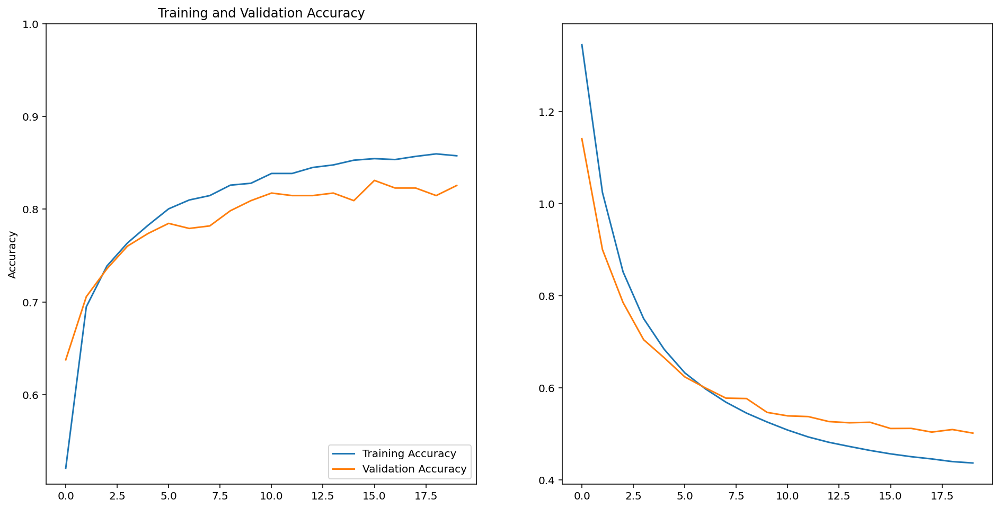

In [11]:
EPOCHS = 20
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

def scheduler(epoch, lr):
  if epoch < 10:
    return lr
  else:
    return lr * tf.math.exp(-0.1)

callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Train
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches,
                    callbacks=[callback])

# plot
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')

In [12]:
metrics = model.evaluate(test_batches)

12/12 [==============================] - 1s 55ms/step - loss: 0.4750 - accuracy: 0.8447


### Vgg-Option 3 (scheduler + Adam)

Epoch 1/20
92/92 [==============================] - 52s 566ms/step - loss: 1.3788 - accuracy: 0.5116 - val_loss: 1.1499 - val_accuracy: 0.6594 - lr: 1.0000e-04
Epoch 2/20
92/92 [==============================] - 7s 78ms/step - loss: 1.0360 - accuracy: 0.7003 - val_loss: 0.8949 - val_accuracy: 0.7357 - lr: 1.0000e-04
Epoch 3/20
92/92 [==============================] - 7s 76ms/step - loss: 0.8530 - accuracy: 0.7422 - val_loss: 0.7730 - val_accuracy: 0.7520 - lr: 1.0000e-04
Epoch 4/20
92/92 [==============================] - 8s 88ms/step - loss: 0.7508 - accuracy: 0.7629 - val_loss: 0.7043 - val_accuracy: 0.7520 - lr: 1.0000e-04
Epoch 5/20
92/92 [==============================] - 7s 76ms/step - loss: 0.6833 - accuracy: 0.7888 - val_loss: 0.6546 - val_accuracy: 0.7602 - lr: 1.0000e-04
Epoch 6/20
92/92 [==============================] - 7s 77ms/step - loss: 0.6350 - accuracy: 0.8011 - val_loss: 0.6208 - val_accuracy: 0.7738 - lr: 1.0000e-04
Epoch 7/20
92/92 [==============================] 

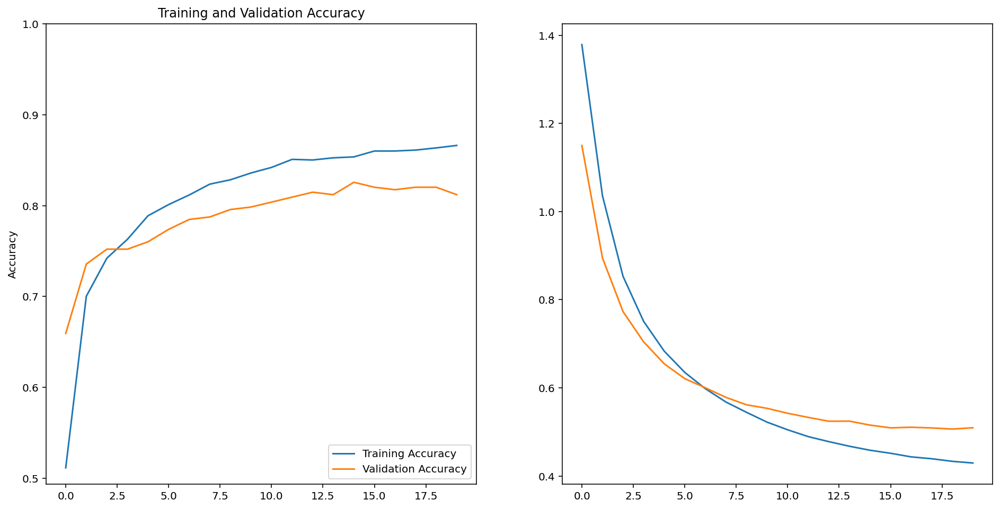

In [10]:
EPOCHS = 20
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

def scheduler(epoch, lr):
  if epoch < 10:
    return lr
  else:
    return lr * tf.math.exp(-0.1)

callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Train
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches,
                    callbacks=[callback])

# plot
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')

In [11]:
metrics = model.evaluate(test_batches)

12/12 [==============================] - 1s 53ms/step - loss: 0.4716 - accuracy: 0.8256


### Option4 (SGD_schedule)

Epoch 1/20
92/92 [==============================] - 52s 562ms/step - loss: 1.5947 - accuracy: 0.2428 - val_loss: 1.5842 - val_accuracy: 0.2452 - lr: 1.0000e-04
Epoch 2/20
92/92 [==============================] - 7s 76ms/step - loss: 1.5793 - accuracy: 0.3147 - val_loss: 1.5687 - val_accuracy: 0.3351 - lr: 1.0000e-04
Epoch 3/20
92/92 [==============================] - 7s 76ms/step - loss: 1.5696 - accuracy: 0.3495 - val_loss: 1.5581 - val_accuracy: 0.3515 - lr: 1.0000e-04
Epoch 4/20
92/92 [==============================] - 7s 76ms/step - loss: 1.5627 - accuracy: 0.3617 - val_loss: 1.5500 - val_accuracy: 0.3569 - lr: 1.0000e-04
Epoch 5/20
92/92 [==============================] - 7s 79ms/step - loss: 1.5571 - accuracy: 0.3576 - val_loss: 1.5435 - val_accuracy: 0.3624 - lr: 1.0000e-04
Epoch 6/20
92/92 [==============================] - 7s 78ms/step - loss: 1.5523 - accuracy: 0.3546 - val_loss: 1.5377 - val_accuracy: 0.3760 - lr: 1.0000e-04
Epoch 7/20
92/92 [==============================] 

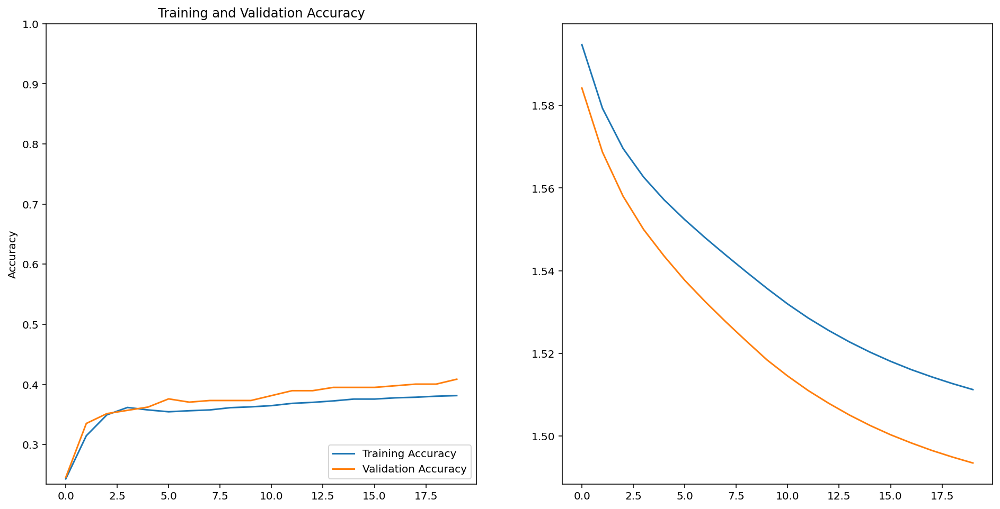

In [9]:
EPOCHS = 20
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.SGD(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

def scheduler(epoch, lr):
  if epoch < 10:
    return lr
  else:
    return lr * tf.math.exp(-0.1)

callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Train
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches,
                    callbacks=[callback])

# plot
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')

In [10]:
metrics = model.evaluate(test_batches)

12/12 [==============================] - 1s 54ms/step - loss: 1.5345 - accuracy: 0.3215


### Option5 (adadelta + schedule)

Epoch 1/20
92/92 [==============================] - 48s 519ms/step - loss: 1.6435 - accuracy: 0.1911 - val_loss: 1.6693 - val_accuracy: 0.1771 - lr: 1.0000e-04
Epoch 2/20
92/92 [==============================] - 7s 76ms/step - loss: 1.6420 - accuracy: 0.1914 - val_loss: 1.6675 - val_accuracy: 0.1771 - lr: 1.0000e-04
Epoch 3/20
92/92 [==============================] - 7s 76ms/step - loss: 1.6406 - accuracy: 0.1918 - val_loss: 1.6657 - val_accuracy: 0.1771 - lr: 1.0000e-04
Epoch 4/20
92/92 [==============================] - 7s 76ms/step - loss: 1.6391 - accuracy: 0.1924 - val_loss: 1.6639 - val_accuracy: 0.1744 - lr: 1.0000e-04
Epoch 5/20
92/92 [==============================] - 7s 77ms/step - loss: 1.6377 - accuracy: 0.1924 - val_loss: 1.6622 - val_accuracy: 0.1744 - lr: 1.0000e-04
Epoch 6/20
92/92 [==============================] - 7s 76ms/step - loss: 1.6363 - accuracy: 0.1928 - val_loss: 1.6604 - val_accuracy: 0.1744 - lr: 1.0000e-04
Epoch 7/20
92/92 [==============================] 

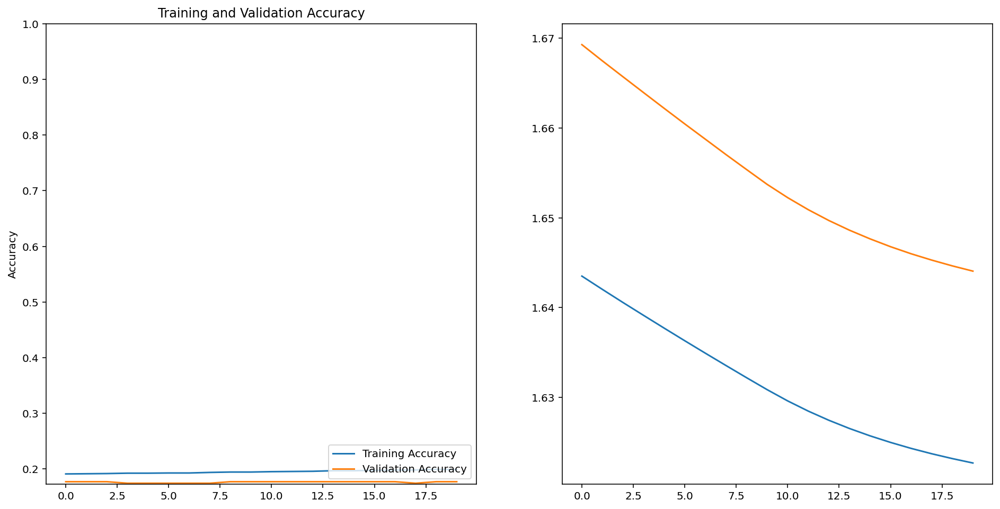

In [11]:
EPOCHS = 20
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adadelta(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

def scheduler(epoch, lr):
  if epoch < 10:
    return lr
  else:
    return lr * tf.math.exp(-0.1)

callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Train
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches,
                    callbacks=[callback])

# plot
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')

In [12]:
metrics = model.evaluate(test_batches)

12/12 [==============================] - 1s 62ms/step - loss: 1.6126 - accuracy: 0.2044


# Option6 (RMS + schdule + Epoch 40)

Epoch 1/40
92/92 [==============================] - 49s 532ms/step - loss: 1.3687 - accuracy: 0.5313 - val_loss: 1.1508 - val_accuracy: 0.6485 - lr: 1.0000e-04
Epoch 2/40
92/92 [==============================] - 7s 76ms/step - loss: 1.0313 - accuracy: 0.7040 - val_loss: 0.8992 - val_accuracy: 0.7139 - lr: 1.0000e-04
Epoch 3/40
92/92 [==============================] - 7s 76ms/step - loss: 0.8532 - accuracy: 0.7428 - val_loss: 0.7758 - val_accuracy: 0.7166 - lr: 1.0000e-04
Epoch 4/40
92/92 [==============================] - 7s 76ms/step - loss: 0.7511 - accuracy: 0.7663 - val_loss: 0.7127 - val_accuracy: 0.7466 - lr: 1.0000e-04
Epoch 5/40
92/92 [==============================] - 7s 76ms/step - loss: 0.6859 - accuracy: 0.7861 - val_loss: 0.6590 - val_accuracy: 0.7657 - lr: 1.0000e-04
Epoch 6/40
92/92 [==============================] - 7s 77ms/step - loss: 0.6391 - accuracy: 0.7939 - val_loss: 0.6198 - val_accuracy: 0.7738 - lr: 1.0000e-04
Epoch 7/40
92/92 [==============================] 

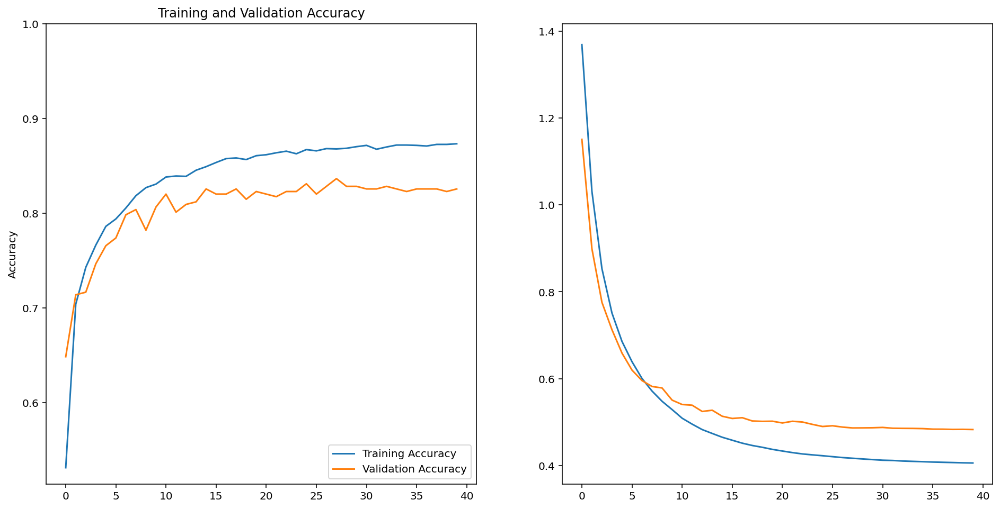

In [10]:
EPOCHS = 40
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

def scheduler(epoch, lr):
  if epoch < 10:
    return lr
  else:
    return lr * tf.math.exp(-0.1)

callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Train
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches,
                    callbacks=[callback])

# plot
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')

In [11]:
metrics = model.evaluate(test_batches)

12/12 [==============================] - 1s 54ms/step - loss: 0.4646 - accuracy: 0.8392


# Option7 (Adam + schdule + Epoch 75)

Epoch 1/75
92/92 [==============================] - 48s 527ms/step - loss: 1.3959 - accuracy: 0.4963 - val_loss: 1.1827 - val_accuracy: 0.6839 - lr: 1.0000e-04
Epoch 2/75
92/92 [==============================] - 7s 76ms/step - loss: 1.0548 - accuracy: 0.7027 - val_loss: 0.9302 - val_accuracy: 0.7384 - lr: 1.0000e-04
Epoch 3/75
92/92 [==============================] - 7s 76ms/step - loss: 0.8730 - accuracy: 0.7456 - val_loss: 0.7971 - val_accuracy: 0.7466 - lr: 1.0000e-04
Epoch 4/75
92/92 [==============================] - 7s 76ms/step - loss: 0.7675 - accuracy: 0.7660 - val_loss: 0.7249 - val_accuracy: 0.7575 - lr: 1.0000e-04
Epoch 5/75
92/92 [==============================] - 7s 77ms/step - loss: 0.6998 - accuracy: 0.7837 - val_loss: 0.6778 - val_accuracy: 0.7657 - lr: 1.0000e-04
Epoch 6/75
92/92 [==============================] - 7s 76ms/step - loss: 0.6525 - accuracy: 0.7970 - val_loss: 0.6380 - val_accuracy: 0.7684 - lr: 1.0000e-04
Epoch 7/75
92/92 [==============================] 

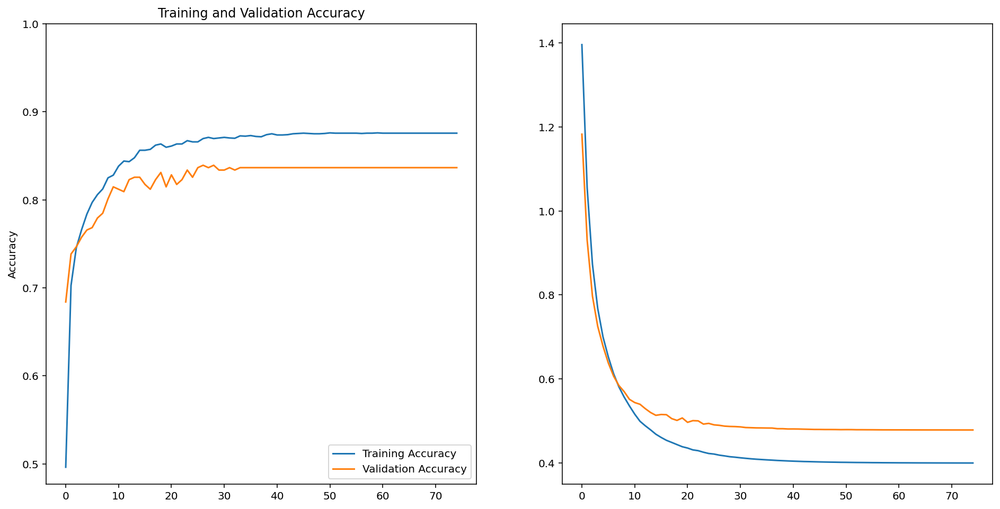

In [10]:
EPOCHS = 75
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

def scheduler(epoch, lr):
  if epoch < 10:
    return lr
  else:
    return lr * tf.math.exp(-0.1)

callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Train
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches,
                    callbacks=[callback])

# plot
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')

In [11]:
metrics = model.evaluate(test_batches)

12/12 [==============================] - 1s 54ms/step - loss: 0.4554 - accuracy: 0.8420


# Option8 (Adam + schdule + Epoch 75+Dropout)

Epoch 1/75
92/92 [==============================] - 50s 540ms/step - loss: 1.4717 - accuracy: 0.3753 - val_loss: 1.1846 - val_accuracy: 0.6294 - lr: 1.0000e-04
Epoch 2/75
92/92 [==============================] - 7s 76ms/step - loss: 1.1090 - accuracy: 0.6138 - val_loss: 0.8516 - val_accuracy: 0.7003 - lr: 1.0000e-04
Epoch 3/75
92/92 [==============================] - 7s 76ms/step - loss: 0.8925 - accuracy: 0.6771 - val_loss: 0.7233 - val_accuracy: 0.7193 - lr: 1.0000e-04
Epoch 4/75
92/92 [==============================] - 7s 76ms/step - loss: 0.7718 - accuracy: 0.7108 - val_loss: 0.6736 - val_accuracy: 0.7357 - lr: 1.0000e-04
Epoch 5/75
92/92 [==============================] - 7s 76ms/step - loss: 0.7105 - accuracy: 0.7391 - val_loss: 0.6014 - val_accuracy: 0.7602 - lr: 1.0000e-04
Epoch 6/75
92/92 [==============================] - 7s 76ms/step - loss: 0.6531 - accuracy: 0.7698 - val_loss: 0.5939 - val_accuracy: 0.7711 - lr: 1.0000e-04
Epoch 7/75
92/92 [==============================] 

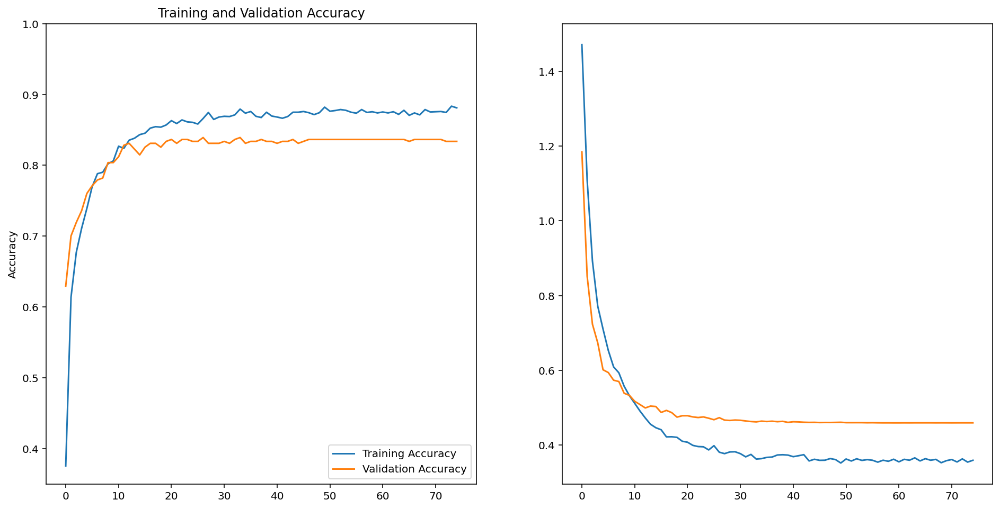

In [8]:
feature_batch_average = global_average_layer(feature_batch)
base_model.trainable = False
dense_layer = tf.keras.layers.Dense(512, activation='relu')
drop = tf.keras.layers.Dropout(0.5)
dense_layer2 = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')
prediction_batch = prediction_layer(dense_layer(feature_batch_average)) 


model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
    drop,
    dense_layer2,
  prediction_layer
]) 

EPOCHS = 75
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

def scheduler(epoch, lr):
  if epoch < 10:
    return lr
  else:
    return lr * tf.math.exp(-0.1)

callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Train
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches,
                    callbacks=[callback])

# plot
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')

In [9]:
metrics = model.evaluate(test_batches)

12/12 [==============================] - 1s 54ms/step - loss: 0.4132 - accuracy: 0.8529


## Optional9 Train all(rms)

Epoch 1/20
92/92 [==============================] - 91s 991ms/step - loss: 1.2849 - accuracy: 0.4966 - val_loss: 0.5868 - val_accuracy: 0.7629
Epoch 2/20
92/92 [==============================] - 17s 185ms/step - loss: 0.6476 - accuracy: 0.7636 - val_loss: 0.5988 - val_accuracy: 0.7956
Epoch 3/20
92/92 [==============================] - 17s 187ms/step - loss: 0.4867 - accuracy: 0.8256 - val_loss: 0.4763 - val_accuracy: 0.8420
Epoch 4/20
92/92 [==============================] - 17s 186ms/step - loss: 0.4355 - accuracy: 0.8512 - val_loss: 0.4249 - val_accuracy: 0.8147
Epoch 5/20
92/92 [==============================] - 17s 187ms/step - loss: 0.3399 - accuracy: 0.8832 - val_loss: 0.2795 - val_accuracy: 0.8965
Epoch 6/20
92/92 [==============================] - 17s 190ms/step - loss: 0.3689 - accuracy: 0.8879 - val_loss: 0.2543 - val_accuracy: 0.9292
Epoch 7/20
92/92 [==============================] - 18s 197ms/step - loss: 0.2908 - accuracy: 0.9033 - val_loss: 0.6066 - val_accuracy: 0.8338

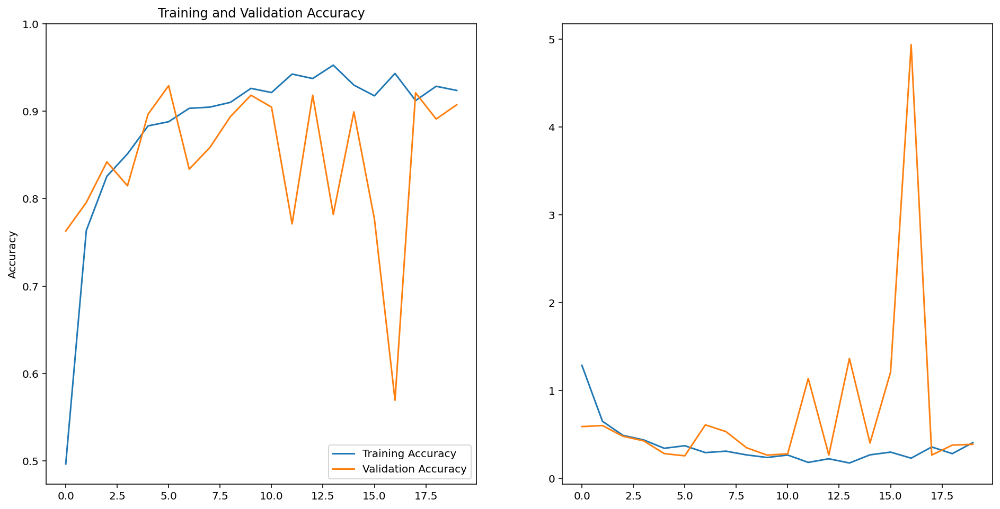

In [8]:
feature_batch_average = global_average_layer(feature_batch)

dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')
prediction_batch = prediction_layer(dense_layer(feature_batch_average)) 


model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
]) 

EPOCHS = 20
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

# Train
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

# plot
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')

In [9]:
metrics = model.evaluate(test_batches)

12/12 [==============================] - 1s 54ms/step - loss: 0.3198 - accuracy: 0.9046


# 결론
imagenet과 동일한 label이 아닐 경우 초기 가중치로써 사용하고 전략1을 사용하는게 좋다.